In [1]:
# https://www.sc-best-practices.org/conditions/gsea_pathway.html#id380
# Kang HM, Subramaniam M, Targ S, et al. Multiplexed droplet single-cell RNA-sequencing using natural genetic variation
#   Nat Biotechnol. 2020 Nov;38(11):1356]. Nat Biotechnol. 2018;36(1):89-94. doi:10.1038/nbt.4042

In [46]:
%load_ext autoreload
%autoreload 2

import scanpy as sc
import tensorflow as tf
from tensorflow.keras.models import Model
from ivae_scorer.datasets import load_kang
from tensorflow.keras import callbacks
from ivae_scorer.utils import set_all_seeds
from ivae_scorer.bio import get_adj_matrices, sync_gexp_adj, build_hipathia_renamers
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import minmax_scale
import matplotlib.pyplot as plt
import seaborn as sns
import dotenv
from pathlib import Path

project_path = Path(dotenv.find_dotenv()).parent
results_path = project_path.joinpath("results")
results_path.mkdir(exist_ok=True, parents=True)
data_path = project_path.joinpath("data")
data_path.mkdir(exist_ok=True, parents=True)
figs_path = results_path.joinpath("figs")
figs_path.mkdir(exist_ok=True, parents=True)
tables_path = results_path.joinpath("tables")
tables_path.mkdir(exist_ok=True, parents=True)

set_all_seeds(seed=42)

tf.config.experimental.enable_op_determinism()

sc.set_figure_params(dpi=300, color_map="inferno")
sc.settings.verbosity = 1
sc.logging.print_header()

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
scanpy==1.9.3 anndata==0.9.1 umap==0.5.3 numpy==1.23.5 scipy==1.10.1 pandas==2.0.1 scikit-learn==1.2.2 statsmodels==0.13.5 python-igraph==0.10.3 pynndescent==0.5.10


In [3]:
adata = load_kang(data_folder=data_path, normalize=True, n_genes=4000)

In [4]:
x_trans = adata.to_df()

In [5]:
circuit_adj, circuit_to_pathway_adj = get_adj_matrices(
    gene_list=x_trans.columns.to_list()
)

circuit_adj.head()

circuit,P-hsa03320-62,P-hsa03320-45,P-hsa03320-43,P-hsa03320-23,P-hsa03320-32,P-hsa03320-8,P-hsa03320-7,P-hsa03320-9,P-hsa03320-39,P-hsa03320-38,...,P-hsa04976-38,P-hsa04976-37,P-hsa04976-36,P-hsa04976-34,P-hsa04976-41,P-hsa04976-16,P-hsa05100-55,P-hsa05100-33,P-hsa05100-15,P-hsa05100-24
symbol,,,,,,,,,,,,,,,,,,,,,
AKT3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
TANK,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
BCL2L11,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
SH2B3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
FRAT1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [7]:
x_trans, circuit_adj = sync_gexp_adj(gexp=x_trans, adj=circuit_adj)
x_trans.shape, circuit_adj.shape, circuit_to_pathway_adj.shape

((24673, 1820), (1820, 1203), (1203, 92))

In [11]:
obs = adata.obs.copy()

x_train, x_test = train_test_split(
    x_trans.apply(minmax_scale),
    test_size=0.33,
    stratify=obs["cell_type"],
    random_state=42,
)
x_train = x_train.astype("float32")
x_test = x_test.astype("float32")

In [12]:
from ivae_scorer.models import build_kegg_vae

vae, encoder, decoder = build_kegg_vae(circuits=circuit_adj, pathways=circuit_to_pathway_adj)

In [13]:
batch_size = 32

callback = callbacks.EarlyStopping(
    monitor="val_loss",  # Stop training when `val_loss` is no longer improving
    min_delta=1e-1,  # "no longer improving" being defined as "no better than 1e-5 less"
    patience=30,  # "no longer improving" being further defined as "for at least 3 epochs"
    verbose=0,
)

history = vae.fit(
    x_train.values,
    shuffle=True,
    verbose=0,
    epochs=100,
    batch_size=batch_size,
    callbacks=[callback],
    validation_data=(x_test.values, None),
)

2023-04-28 17:18:48.267608: I tensorflow/stream_executor/cuda/cuda_blas.cc:1614] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.


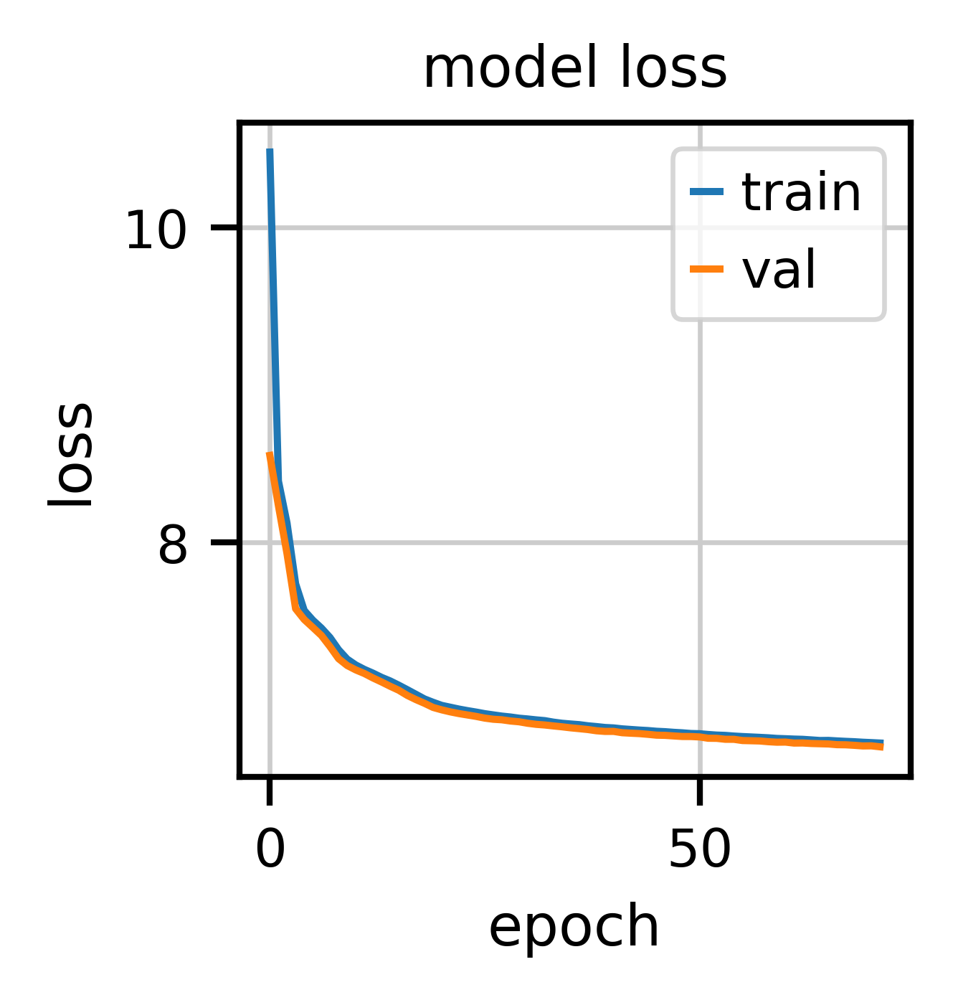

In [14]:
with sns.plotting_context("paper"):
    history.history.keys()
    # summarize history for loss
    plt.figure(figsize=(2, 2))
    plt.plot(history.history["loss"])
    plt.plot(history.history["val_loss"])
    plt.title("model loss")
    plt.ylabel("loss")
    plt.xlabel("epoch")
    plt.legend(["train", "val"], loc="upper right")

In [21]:
import pandas as pd

x_train_encoded = encoder.predict(x_train, batch_size=batch_size)[0]
x_train_encoded = pd.DataFrame(x_train_encoded, index=x_train.index)

adata = sc.AnnData(X=x_train_encoded)
adata.obs = obs.loc[x_train.index]

# sc.pp.log1p(adata)
sc.pp.neighbors(adata, use_rep="X", random_state=42)
sc.tl.leiden(adata, random_state=42)
sc.tl.umap(adata, random_state=42)

517/517 [==============================] - 0s 553us/step


/home/carlos/github/ivae_scorer/.venv/lib/python3.10/site-packages/anndata/_core/anndata.py:117: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [22]:
layer_outputs = [layer.output for layer in encoder.layers]
activation_model = Model(inputs=encoder.input, outputs=layer_outputs)

In [25]:
# circuit activity extracted from first layer
layer_id = 1

circuit_renamer, pathway_renamer, circuit_to_effector = build_hipathia_renamers()

if layer_id == 1:
    entitie_names = circuit_adj.rename(columns=circuit_renamer).columns

x_train_encoded = activation_model.predict(x_train, batch_size=batch_size)[layer_id]
x_train_encoded = pd.DataFrame(
    x_train_encoded, index=x_train.index, columns=entitie_names
)

entities_adata = sc.AnnData(X=x_train_encoded.abs())
entities_adata.obs = obs.loc[x_train.index]

# sc.pp.log1p(adata)
sc.pp.neighbors(entities_adata, use_rep="X", random_state=42)
sc.tl.leiden(entities_adata, random_state=42)
sc.tl.umap(entities_adata, random_state=42)

517/517 [==============================] - 0s 660us/step


In [26]:
method = "wilcoxon"
sc.tl.rank_genes_groups(
    entities_adata, "condition", refrence="control", key_added=method, method=method
)

result = entities_adata.uns[method]
groups = ["stimulated"]
dacs = pd.DataFrame(
    {
        group + "_" + key: result[key][group]
        for group in groups
        for key in ["names", "scores", "pvals", "pvals_adj", "logfoldchanges"]
    }
)

dacs.head(10)

,stimulated_names,stimulated_scores,stimulated_pvals,stimulated_pvals_adj,stimulated_logfoldchanges
0,RIG-I-like receptor signaling pathway: IRF3 PIN1,103.753189,0.0,0.0,2.595526
1,RIG-I-like receptor signaling pathway: NFKB1,102.960861,0.0,0.0,2.525322
2,RIG-I-like receptor signaling pathway: MAPK14,102.765686,0.0,0.0,2.479017
3,RIG-I-like receptor signaling pathway: CHUK IK...,101.733879,0.0,0.0,2.421949
4,RIG-I-like receptor signaling pathway: MAPK8,101.692444,0.0,0.0,2.476924
5,RIG-I-like receptor signaling pathway: IRF7,101.127174,0.0,0.0,2.723545
6,RIG-I-like receptor signaling pathway: MAVS TM...,95.680511,0.0,0.0,2.146449
7,Cytosolic DNA-sensing pathway: TBK1,71.835373,0.0,0.0,2.626366
8,Cytosolic DNA-sensing pathway: IKBKE,71.465134,0.0,0.0,2.231187
9,Toll-like receptor signaling pathway: IFNA1,61.615242,0.0,0.0,1.491212


In [49]:
dacs_to_write = dacs.head(10).copy()
dacs_to_write.columns = dacs_to_write.columns.str.replace("stimulated_", "")
dacs_to_write = dacs_to_write.rename(columns={"names": "pathways"})
dacs_to_write["pathways"] = dacs_to_write["pathways"].str.title()
dacs_to_write = dacs_to_write.drop("pvals", axis=1)
dacs_to_write["pathways"] = dacs_to_write["pathways"].str.replace(
    "Alpha Beta", r"$\alpha, \beta$"
)
dacs_to_write["pathways"] = (dacs_to_write["pathways"]
    .str.replace("Signaling Pathway", "")
    .str.replace(" Pathway", "")
    .str.replace(" :", ":")
)
dacs_to_write.to_latex(
    tables_path.joinpath("ivae_scorer_kegg.tex"),
    float_format="%.2f",
    index=False,
    escape=True,
)

dacs_to_write

,pathways,scores,pvals_adj,logfoldchanges
0,Rig-I-Like Receptor: Irf3 Pin1,103.753189,0.0,2.595526
1,Rig-I-Like Receptor: Nfkb1,102.960861,0.0,2.525322
2,Rig-I-Like Receptor: Mapk14,102.765686,0.0,2.479017
3,Rig-I-Like Receptor: Chuk Ikbkb Ikbkg,101.733879,0.0,2.421949
4,Rig-I-Like Receptor: Mapk8,101.692444,0.0,2.476924
5,Rig-I-Like Receptor: Irf7,101.127174,0.0,2.723545
6,Rig-I-Like Receptor: Mavs Tmem173,95.680511,0.0,2.146449
7,Cytosolic Dna-Sensing: Tbk1,71.835373,0.0,2.626366
8,Cytosolic Dna-Sensing: Ikbke,71.465134,0.0,2.231187
9,Toll-Like Receptor: Ifna1,61.615242,0.0,1.491212


In [43]:
dacs_top = dacs["stimulated_names"][:10]
# dacs_top = dacs_top[dacs_top.str.contains("interferon|ifn", case=False)]
dacs_top

0     RIG-I-like receptor signaling pathway: IRF3 PIN1
1         RIG-I-like receptor signaling pathway: NFKB1
2        RIG-I-like receptor signaling pathway: MAPK14
3    RIG-I-like receptor signaling pathway: CHUK IK...
4         RIG-I-like receptor signaling pathway: MAPK8
5          RIG-I-like receptor signaling pathway: IRF7
6    RIG-I-like receptor signaling pathway: MAVS TM...
7                  Cytosolic DNA-sensing pathway: TBK1
8                 Cytosolic DNA-sensing pathway: IKBKE
9          Toll-like receptor signaling pathway: IFNA1
Name: stimulated_names, dtype: object

In [50]:
names_to_plot = (
    dacs_top.str.replace("signaling pathway", "")
    .str.replace(" pathway", "")
    .str.replace(" :", ":")
    .tolist()
)

adata.obsm["pathways"] = x_train_encoded.abs()
adata.obs[names_to_plot] = adata.obsm["pathways"][dacs_top]

In [51]:
sc.pl.umap(
    adata,
    color=["condition", "cell_type"] + names_to_plot,
    frameon=False,
    ncols=2,
    wspace=0.3,
    show=False,
)

plt.savefig(figs_path.joinpath("ivae_scorer_kegg_ifn_top10.pdf"), bbox_inches="tight")

/home/carlos/github/ivae_scorer/.venv/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/carlos/github/ivae_scorer/.venv/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
